Dataset 1 - made from manually downloading Instagram images, 50 images per class, 5 classes - animals, food, beauty, memes and travel

Dataset - 2 - made by merging kaggle datasets, roughly 1000-1500 images per class, 5 classes - pets (cats and dogs), food(Indian food), beauty, travel(oceans, gardens and mountains) and memes

Links to both datasets-
Dataset 1 - https://www.kaggle.com/datasets/anupriyakkumari/instagram-5-classes-dataset-1
Dataset 2 - https://www.kaggle.com/datasets/anupriyakkumari/instagram-5-classes-dataset-2

Make sure to change the paths of the dataset directories after downloading them on colab.

Assuming datasets are downloaded in /content, the paths are changed in the code snippets below.

#1. Transfer Learning Model - Xception

The following approach uses transfer learning on base model Xception. We need to run each cell one by one. Importing these libraries is first step.
Then we need our dataset divided into train, validation and test folders (each with subfolders of 5 classes) and uploaded on colab (either by mounting drive or uploading from system) and changing each of "directory_train", "directory_validation" and "directory_test" paths respectively by right clicking on folder from files section and selecting "copy path".



In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow import keras

Here, we are uploading our files from each of the folders and subfolders, setting the parameters as required for the model and printing the class names, creating a dictionary to access class names, and printing number of batches in each folder - train, validation and test

In [ ]:
dir_train = "/content/dataset_1/classes"
dir_new="/content/dataset_2/classes"
#using bigger dataset for now
train_ds=tf.keras.utils.image_dataset_from_directory(
    dir_new,
    color_mode="rgb",
    image_size=(150, 150),
    validation_split=0.1,
    subset="training",
    shuffle=True,
    seed=2,
    batch_size=64
    )

validation_ds=tf.keras.utils.image_dataset_from_directory(
    dir_new,
    color_mode="rgb",
    image_size=(150, 150),
    validation_split=0.1,
    subset="validation",
    shuffle=True,
    seed=2,
    batch_size=64
    )
directory_test1="/content/dataset_1/test"
directory_test2="/content/dataset_2/test"
test_ds=tf.keras.utils.image_dataset_from_directory(
    directory_test2,
    color_mode="rgb",
    image_size=(150, 150),
    shuffle=True,
    seed=2,
    batch_size=64
    )
class_names = train_ds.class_names
print(class_names)
#class_names_dic1={0:'animals',1:'beauty',2:'food',3:'memes',4:'travel'}
class_names_dic2={0:'beauty',1:'food',2:'memes',3:'pets',4:'travel'}

print("Number of training samples: %d" % tf.data.experimental.cardinality(train_ds))
print(
    "Number of validation samples: %d" % tf.data.experimental.cardinality(validation_ds)
)
print("Number of test samples: %d" % tf.data.experimental.cardinality(test_ds))

Found 250 files belonging to 5 classes.
Using 225 files for training.
Found 250 files belonging to 5 classes.
Using 25 files for validation.
Found 50 files belonging to 5 classes.
['animals', 'beauty', 'food', 'memes', 'travel']
Number of training samples: 4
Number of validation samples: 1
Number of test samples: 1


Now, by running this cell, we get the shape of the image and label as it gets uploaded using tf.keras.utils.image_dataset_from_directory first as batches and in those batches are images (float32 tensor) and labels (int32 tensor). We created batches of 10.

In [ ]:
for image, label in train_ds.take(1):
  #print element in the tuple of train_ds which has 2 tuples inside indicating (batchsize,height,width,channels) and (batchsize,) 
    print(image.shape, label.shape)
    for image, label in zip(image, label):
      #each batch further has 64 images each in it stored in zip(image,label)
        print(image.shape, label)
  

(64, 150, 150, 3) (64,)
(150, 150, 3) tf.Tensor(1, shape=(), dtype=int32)
(150, 150, 3) tf.Tensor(3, shape=(), dtype=int32)
(150, 150, 3) tf.Tensor(0, shape=(), dtype=int32)
(150, 150, 3) tf.Tensor(0, shape=(), dtype=int32)
(150, 150, 3) tf.Tensor(3, shape=(), dtype=int32)
(150, 150, 3) tf.Tensor(1, shape=(), dtype=int32)
(150, 150, 3) tf.Tensor(4, shape=(), dtype=int32)
(150, 150, 3) tf.Tensor(0, shape=(), dtype=int32)
(150, 150, 3) tf.Tensor(4, shape=(), dtype=int32)
(150, 150, 3) tf.Tensor(2, shape=(), dtype=int32)
(150, 150, 3) tf.Tensor(2, shape=(), dtype=int32)
(150, 150, 3) tf.Tensor(0, shape=(), dtype=int32)
(150, 150, 3) tf.Tensor(0, shape=(), dtype=int32)
(150, 150, 3) tf.Tensor(3, shape=(), dtype=int32)
(150, 150, 3) tf.Tensor(2, shape=(), dtype=int32)
(150, 150, 3) tf.Tensor(2, shape=(), dtype=int32)
(150, 150, 3) tf.Tensor(4, shape=(), dtype=int32)
(150, 150, 3) tf.Tensor(3, shape=(), dtype=int32)
(150, 150, 3) tf.Tensor(3, shape=(), dtype=int32)
(150, 150, 3) tf.Tensor(1,

By running the cell below, we plot the 10 images from one batch randomly in a 2x5 plot.

IndexError: ignored

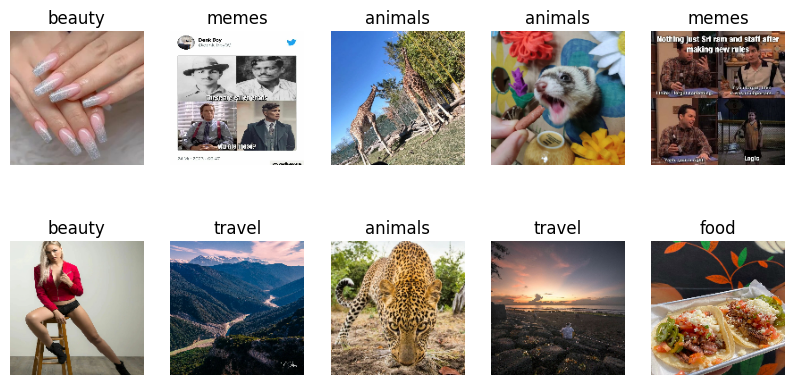

In [ ]:
import matplotlib.pyplot as plt
class_names = list(train_ds.class_names)
# Create a figure with 2 rows and 5 columns of subplots
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(10,5))

# Flatten the axes array to simplify indexing
axes = axes.flatten()
for images, labels in train_ds:
  # Plot each image on a subplot
  for i in range(len(images)):
    axes[i].imshow(images[i].numpy().astype('uint8'))
    axes[i].set_title(class_names_dic2[(labels[i].numpy())])
    axes[i].axis('off')
# Show the plot
plt.show()

Here we are creating a  data augmentation layer

In [ ]:
from tensorflow import keras
from tensorflow.keras import layers

data_augmentation = keras.Sequential(
    [layers.RandomFlip("horizontal"), layers.RandomRotation(0.1), layers.RandomContrast(factor=0.2),
]
)

Here we are visualizing the first augmented image from the first batch and showing the variation produced on a 9x9 plot

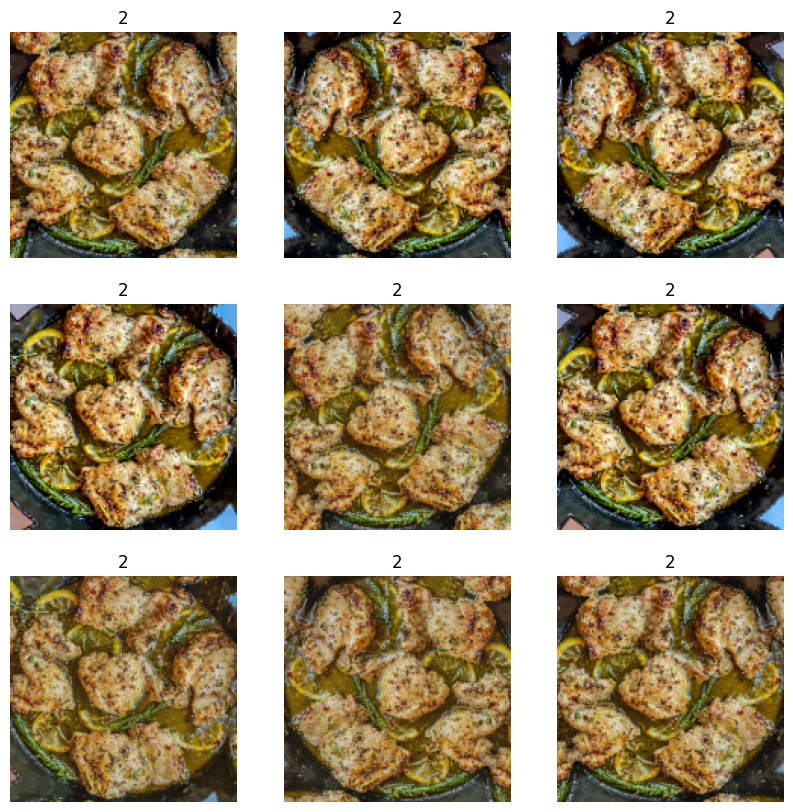

In [ ]:
import numpy as np
for images, labels in train_ds.take(1):
    plt.figure(figsize=(10, 10))
    first_image = images[0]
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        augmented_image = data_augmentation(
            tf.expand_dims(first_image, 0), training=True
        )
        plt.imshow(augmented_image[0].numpy().astype("int32"))
        plt.title(int(labels[0]))
        plt.axis("off")
    

Now we get a base model, Xception (trained on Imagenet) and proceed to freeze it.

In [ ]:
base_model = keras.applications.Xception(
    weights="imagenet",  # Load weights pre-trained on ImageNet.
    input_shape=(150, 150, 3),
    include_top=False,)
  # Do not include the ImageNet classifier at the top as we don't need those classes

# Freeze the base_model
base_model.trainable = False

# Create new model on top
inputs = keras.Input(shape=(150, 150, 3))
x = data_augmentation(inputs)  # Apply random data augmentation from the layer we created above

# Pre-trained Xception weights requires that input be scaled
# from (0, 255) to a range of (-1., +1.), the rescaling layer
# outputs: `(inputs * scale) + offset`
# we create a rescaling layer and apply it to "x" which already has data augmentation applied to it
scale_layer = keras.layers.Rescaling(scale=1 / 127.5, offset=-1)
x = scale_layer(x)

# The base model contains batchnorm layers. We want to keep them in inference mode (moving forward and not changing any weights/biases yet, only giving result)
# when we unfreeze the base model for fine-tuning, so we make sure that the
# base_model is running in inference mode here, hence training is false
x = base_model(x, training=False)
# using pooling layer
x = keras.layers.GlobalAveragePooling2D()(x)
x = keras.layers.Dropout(0.2)(x)  # Regularize with dropout
outputs = keras.layers.Dense(1)(x) 
model = keras.Model(inputs, outputs)

model.summary()

83683744/83683744 [==============================] - 1s 0us/step
Model: "model_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_7 (InputLayer)        [(None, 150, 150, 3)]     0         
                                                                 
 sequential (Sequential)     (None, 150, 150, 3)       0         
                                                                 
 rescaling (Rescaling)       (None, 150, 150, 3)       0         
                                                                 
 xception (Functional)       (None, 5, 5, 2048)        20861480  
                                                                 
 global_average_pooling2d (G  (None, 2048)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dropout_5 (Dropout)         (None, 2048)              0    

In [ ]:
model.compile(
    optimizer=keras.optimizers.Adam(0.001),
    loss=keras.losses.CategoricalCrossentropy(from_logits=True),
    metrics=["accuracy"],
)

epochs =3
model.fit(train_ds, epochs=epochs, validation_data=validation_ds)

Epoch 1/7
4/4 [==============================] - 26s 5s/step - loss: 0.0000e+00 - accuracy: 0.2044 - val_loss: 0.0000e+00 - val_accuracy: 0.1600
Epoch 2/7
4/4 [==============================] - 21s 5s/step - loss: 0.0000e+00 - accuracy: 0.2044 - val_loss: 0.0000e+00 - val_accuracy: 0.1600
Epoch 3/7
4/4 [==============================] - 21s 5s/step - loss: 0.0000e+00 - accuracy: 0.2044 - val_loss: 0.0000e+00 - val_accuracy: 0.1600
Epoch 4/7
4/4 [==============================] - 25s 5s/step - loss: 0.0000e+00 - accuracy: 0.2044 - val_loss: 0.0000e+00 - val_accuracy: 0.1600
Epoch 5/7
4/4 [==============================] - 22s 5s/step - loss: 0.0000e+00 - accuracy: 0.2044 - val_loss: 0.0000e+00 - val_accuracy: 0.1600
Epoch 6/7
4/4 [==============================] - 23s 5s/step - loss: 0.0000e+00 - accuracy: 0.2044 - val_loss: 0.0000e+00 - val_accuracy: 0.1600
Epoch 7/7
4/4 [==============================] - 22s 5s/step - loss: 0.0000e+00 - accuracy: 0.2044 - val_loss: 0.0000e+00 - val_ac

In [ ]:
# Unfreeze the base_model. Note that it keeps running in inference mode
# since we passed `training=False` when calling it. This means that
# the batchnorm layers will not update their batch statistics.
# This prevents the batchnorm layers from undoing all the training
# we've done so far.
base_model.trainable = True
model.summary()

model.compile(
    optimizer=keras.optimizers.Adam(1e-4),  # Low learning rate
    loss=keras.losses.CategoricalCrossentropy(from_logits=True),
    metrics=["accuracy"],
)

epochs = 5
model.fit(train_ds, epochs=epochs, validation_data=validation_ds)

Model: "model_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_7 (InputLayer)        [(None, 150, 150, 3)]     0         
                                                                 
 sequential (Sequential)     (None, 150, 150, 3)       0         
                                                                 
 rescaling (Rescaling)       (None, 150, 150, 3)       0         
                                                                 
 xception (Functional)       (None, 5, 5, 2048)        20861480  
                                                                 
 global_average_pooling2d (G  (None, 2048)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dropout_5 (Dropout)         (None, 2048)              0         
                                                           

In [ ]:
model.save("/content/drive/MyDrive/byopnew/model1.h5")

In [ ]:
test_loss, test_acc = model.evaluate(test_ds)
print('Test accuracy: ',test_acc)
print('Test loss: ',test_loss)

1/1 [==============================] - 12s 12s/step - loss: 0.0000e+00 - accuracy: 0.2000
Test accuracy:  0.20000000298023224
Test loss:  0.0


#2. Transfer Learning Model - MobileNetV2
In this approach, we again use a base model, MobileNetV2 and proceed as in the first approach. Data loading and preprocessing is similar to the second approach with some small changes.

In [ ]:
#loading essential libraries 
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers

In [ ]:
#setting important parameters and loading the three required datasets
batch_size = 64
img_height = 160
img_width = 160
data_dir= "/content/datset_2/classes"
train_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,  
  validation_split=0.1,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

val_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.1,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)
class_names = train_ds.class_names
print(class_names)


Found 250 files belonging to 5 classes.
Using 225 files for training.
Found 250 files belonging to 5 classes.
Using 25 files for validation.
['animals', 'beauty', 'food', 'memes', 'travel']


In [ ]:
#creating test_ds and loading images
batch_size = 32
img_height = 160
img_width = 160
test_dir= "/content/dataset_2/test"
test_ds = tf.keras.utils.image_dataset_from_directory(
  test_dir,  
  image_size=(img_height, img_width),
  batch_size=batch_size)


Found 50 files belonging to 5 classes.


In [ ]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.prefetch(buffer_size=AUTOTUNE)
test_ds = test_ds.prefetch(buffer_size=AUTOTUNE)

In [ ]:
data_augmentation = tf.keras.Sequential([
  tf.keras.layers.RandomFlip('horizontal'),
  tf.keras.layers.RandomRotation(0.2),
  tf.keras.layers.RandomContrast(factor=0.3),

])

In [ ]:
preprocess_input = tf.keras.applications.mobilenet_v2.preprocess_input

In [ ]:
rescale = tf.keras.layers.Rescaling(1./127.5, offset=-1)

In [ ]:
# Create the base model from the pre-trained model MobileNet V2
IMG_SIZE = (160, 160)
IMG_SHAPE = IMG_SIZE + (3,)
base_model = tf.keras.applications.MobileNetV2(input_shape=IMG_SHAPE,
                                               include_top=False,
                                               weights='imagenet')

9406464/9406464 [==============================] - 0s 0us/step


In [ ]:
image_batch, label_batch = next(iter(train_ds))
feature_batch = base_model(image_batch)
print(feature_batch.shape)

(64, 5, 5, 1280)


In [ ]:
base_model.trainable = False

In [ ]:
# Let's take a look at the base model architecture
base_model.summary()

In [ ]:
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(64, 1280)


In [ ]:
prediction_layer = tf.keras.layers.Dense(1)
prediction_batch = prediction_layer(feature_batch_average)
print(prediction_batch.shape)

(64, 1)


In [ ]:
inputs = tf.keras.Input(shape=(160, 160, 3))
x = data_augmentation(inputs)
x = preprocess_input(x)
x = base_model(x, training=False)
x = global_average_layer(x)
x = tf.keras.layers.Dropout(0.2)(x)
outputs = prediction_layer(x)
model = tf.keras.Model(inputs, outputs)

In [ ]:
model.summary()

In [ ]:
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=base_learning_rate),
              loss=tf.keras.losses.CategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [ ]:
len(model.trainable_variables)

2

In [ ]:
initial_epochs = 5

loss0, accuracy0 = model.evaluate(val_ds)

/usr/local/lib/python3.9/dist-packages/tensorflow/python/util/dispatch.py:1176: SyntaxWarning: In loss categorical_crossentropy, expected y_pred.shape to be (batch_size, num_classes) with num_classes > 1. Received: y_pred.shape=(None, 1). Consider using 'binary_crossentropy' if you only have 2 classes.
  return dispatch_target(*args, **kwargs)


1/1 [==============================] - 3s 3s/step - loss: 0.0000e+00 - accuracy: 0.2400


In [ ]:
history = model.fit(train_ds,
                    epochs=initial_epochs,
                    validation_data=val_ds)

Epoch 1/5
4/4 [==============================] - 10s 1s/step - loss: 0.0000e+00 - accuracy: 0.2000 - val_loss: 0.0000e+00 - val_accuracy: 0.2400
Epoch 2/5
4/4 [==============================] - 6s 916ms/step - loss: 0.0000e+00 - accuracy: 0.1733 - val_loss: 0.0000e+00 - val_accuracy: 0.2800
Epoch 3/5
4/4 [==============================] - 8s 908ms/step - loss: 0.0000e+00 - accuracy: 0.1867 - val_loss: 0.0000e+00 - val_accuracy: 0.2800
Epoch 4/5
4/4 [==============================] - 8s 1s/step - loss: 0.0000e+00 - accuracy: 0.1911 - val_loss: 0.0000e+00 - val_accuracy: 0.2800
Epoch 5/5
4/4 [==============================] - 6s 902ms/step - loss: 0.0000e+00 - accuracy: 0.1956 - val_loss: 0.0000e+00 - val_accuracy: 0.2800


In [ ]:
base_model.trainable = True

In [ ]:
# Let's take a look to see how many layers are in the base model
print("Number of layers in the base model: ", len(base_model.layers))

# Fine-tune from this layer onwards
fine_tune_at = 100

# Freeze all the layers before the `fine_tune_at` layer
for layer in base_model.layers[:fine_tune_at]:
  layer.trainable = False

Number of layers in the base model:  154


In [ ]:
model.compile(loss=tf.keras.losses.CategoricalCrossentropy(from_logits=True),
              optimizer = tf.keras.optimizers.RMSprop(learning_rate=base_learning_rate/10),
              metrics=['accuracy'])
model.save('/content/model2.h5')

In [ ]:
fine_tune_epochs = 5
total_epochs =  initial_epochs + fine_tune_epochs

history_fine = model.fit(train_ds,
                         epochs=total_epochs,
                         initial_epoch=history.epoch[-1],
                         validation_data=val_ds)

Epoch 5/10
4/4 [==============================] - 17s 2s/step - loss: 0.0000e+00 - accuracy: 0.1867 - val_loss: 0.0000e+00 - val_accuracy: 0.2800
Epoch 6/10
4/4 [==============================] - 9s 2s/step - loss: 0.0000e+00 - accuracy: 0.1911 - val_loss: 0.0000e+00 - val_accuracy: 0.2800
Epoch 7/10
4/4 [==============================] - 10s 2s/step - loss: 0.0000e+00 - accuracy: 0.1911 - val_loss: 0.0000e+00 - val_accuracy: 0.2800
Epoch 8/10
4/4 [==============================] - 8s 1s/step - loss: 0.0000e+00 - accuracy: 0.1911 - val_loss: 0.0000e+00 - val_accuracy: 0.2800
Epoch 9/10
4/4 [==============================] - 9s 1s/step - loss: 0.0000e+00 - accuracy: 0.1911 - val_loss: 0.0000e+00 - val_accuracy: 0.2800
Epoch 10/10
4/4 [==============================] - 10s 2s/step - loss: 0.0000e+00 - accuracy: 0.1911 - val_loss: 0.0000e+00 - val_accuracy: 0.2800


In [ ]:
loss, accuracy = model.evaluate(test_ds)
print('Test accuracy :', accuracy)
print ('Test loss: ', loss)

2/2 [==============================] - 1s 225ms/step - loss: 0.0000e+00 - accuracy: 0.2000
Test accuracy : 0.20000000298023224
Test loss:  0.0


In [ ]:
# using the last model to display images on unseen data with predicted labels - very inaccuarate, as expected.
from keras.applications.imagenet_utils import preprocess_input
from tensorflow.keras.utils import load_img
from tensorflow.keras.preprocessing import image
from keras.models import load_model
import numpy as np
import os
import matplotlib.pyplot as plt

model = load_model('/content/model1.h5')

# Set the path to the folder containing the images
folder_path = '/content/dataset_2/unseen'

# Loop through the images in the folder
for filename in os.listdir(folder_path):
    
    # Load the image
    img = image.load_img(os.path.join(folder_path, filename), target_size=(180, 180))
    
    # Convert the image to a numpy array
    img_array = image.img_to_array(img)
    
    # Reshape the array to match the input shape of the VGG16 model
    img_array = np.expand_dims(img_array, axis=0)
    
    # Preprocess the input image (normalize pixel values to be between -1 and 1)
    img_array = preprocess_input(img_array)
    
    # Make a prediction on the image
    preds = model_3.predict(img_array)
    print(preds)
    
    # Decode the prediction into a human-readable label
    label = int(preds.argmax(axis=-1))
    label_name={0:'beauty',1:'food',2:'memes',3:'pets',4:'travel'}

    
    # Display the image with predicted label
    plt.imshow(img)
    plt.title(label_name[label])
    plt.show()



ValueError: ignored

#3. Transfer Learning Model - VGG16
After increasing the size of our dataset in the end days, we now use this VGG16 transfer learning model.

In [ ]:
import os
from keras.models import Model
from keras.optimizers import Adam
from keras.applications.vgg16 import VGG16, preprocess_input
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ModelCheckpoint, EarlyStopping
from keras.layers import Dense, Dropout, Flatten
from pathlib import Path
import numpy as np

In [ ]:
BATCH_SIZE = 64

train_generator = ImageDataGenerator(rotation_range=90, 
                                     brightness_range=[0.1, 0.7],
                                     width_shift_range=0.5, 
                                     height_shift_range=0.5,
                                     horizontal_flip=True, 
                                     vertical_flip=True,
                                     validation_split=0.15,
                                     preprocessing_function=preprocess_input) # VGG16 preprocessing

test_generator = ImageDataGenerator(preprocessing_function=preprocess_input) # VGG16 preprocessing

In [ ]:
download_dir = Path('/content/dataset_2')


In [ ]:
train_data_dir = download_dir/'classes'
test_data_dir = download_dir/'test'

traingen = train_generator.flow_from_directory(train_data_dir,
                                               target_size=(224, 224),
                                               class_mode='categorical',
                                               subset='training',
                                               batch_size=BATCH_SIZE, 
                                               shuffle=True,
                                               seed=42)

validgen = train_generator.flow_from_directory(train_data_dir,
                                               target_size=(224, 224),
                                               class_mode='categorical',
                                               subset='validation',
                                               batch_size=BATCH_SIZE,
                                               shuffle=True,
                                               seed=42)

testgen = test_generator.flow_from_directory(test_data_dir,
                                             target_size=(224, 224),
                                             class_mode=None,
                                             batch_size=1,
                                             shuffle=False,
                                             seed=42)

Found 215 images belonging to 5 classes.
Found 35 images belonging to 5 classes.
Found 50 images belonging to 5 classes.


In [ ]:
def create_model(input_shape, n_classes, optimizer='rmsprop', fine_tune=0):
    """
    Compiles a model integrated with VGG16 pretrained layers
    
    input_shape: tuple - the shape of input images (width, height, channels)
    n_classes: int - number of classes for the output layer
    optimizer: string - instantiated optimizer to use for training. Defaults to 'RMSProp'
    fine_tune: int - The number of pre-trained layers to unfreeze.
                If set to 0, all pretrained layers will freeze during training
    """
    
    # Pretrained convolutional layers are loaded using the Imagenet weights.
    # Include_top is set to False, in order to exclude the model's fully-connected layers.
    conv_base = VGG16(include_top=False,
                     weights='imagenet', 
                     input_shape=input_shape)
    
    # Defines how many layers to freeze during training.
    # Layers in the convolutional base are switched from trainable to non-trainable
    # depending on the size of the fine-tuning parameter.
    if fine_tune > 0:
        for layer in conv_base.layers[:-fine_tune]:
            layer.trainable = False
    else:
        for layer in conv_base.layers:
            layer.trainable = False

    # Create a new 'top' of the model (i.e. fully-connected layers).
    # This is 'bootstrapping' a new top_model onto the pretrained layers.
    top_model = conv_base.output
    top_model = Flatten(name="flatten")(top_model)
    top_model = Dense(4096, activation='relu')(top_model)
    top_model = Dense(1072, activation='relu')(top_model)
    top_model = Dropout(0.2)(top_model)
    output_layer = Dense(n_classes, activation='softmax')(top_model)
    
    # Group the convolutional base and new fully-connected layers into a Model object.
    model = Model(inputs=conv_base.input, outputs=output_layer)

    # Compiles the model for training.
    model.compile(optimizer=optimizer, 
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])
    
    return model

In [ ]:
input_shape = (224, 224, 3)
optim_1 = Adam(learning_rate=0.001)
n_classes=5

n_steps = traingen.samples // BATCH_SIZE
n_val_steps = validgen.samples // BATCH_SIZE
n_epochs = 6

# First we'll train the model without Fine-tuning
vgg_model = create_model(input_shape, n_classes, optim_1, fine_tune=0)

In [ ]:
!pip install livelossplot

In [ ]:
from livelossplot.inputs.keras import PlotLossesCallback

plot_loss_1 = PlotLossesCallback()

# ModelCheckpoint callback - save best weights
tl_checkpoint_1 = ModelCheckpoint(filepath='tl_model_v1.weights.best.hdf5',
                                  save_best_only=True,
                                  verbose=1)

# EarlyStopping
early_stop = EarlyStopping(monitor='val_loss',
                           patience=2,
                           restore_best_weights=True,
                           mode='min')

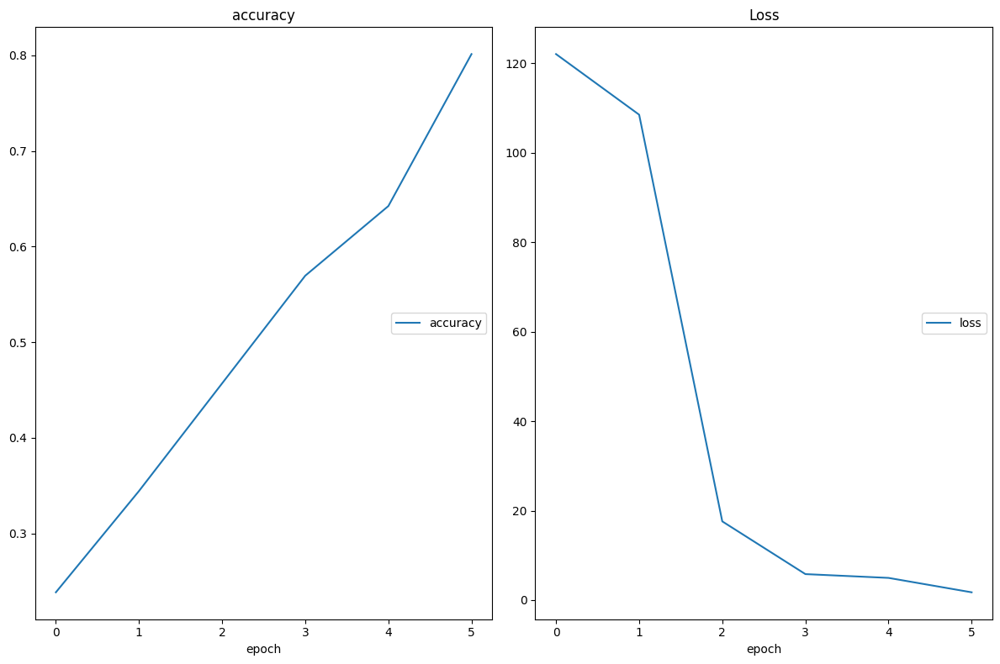

accuracy
	accuracy         	 (min:    0.238, max:    0.801, cur:    0.801)
Loss
	loss             	 (min:    1.740, max:  122.044, cur:    1.740)
3/3 [==============================] - 97s 27s/step - loss: 1.7396 - accuracy: 0.8013
CPU times: user 15min 16s, sys: 44.7 s, total: 16min 1s
Wall time: 13min 21s


In [ ]:
%%time 

vgg_history = vgg_model.fit(traingen,
                            batch_size=BATCH_SIZE,
                            epochs=n_epochs,
                            validation_data=validgen,
                            steps_per_epoch=n_steps,
                            validation_steps=n_val_steps,
                            callbacks=[tl_checkpoint_1, early_stop, plot_loss_1],
                            verbose=1)

In [ ]:
# Generate predictions
vgg_model.load_weights('tl_model_v1.weights.best.hdf5') # initialize the best trained weights

true_classes = testgen.classes
class_indices = traingen.class_indices
class_indices = dict((v,k) for k,v in class_indices.items())

vgg_preds = vgg_model.predict(testgen)
vgg_pred_classes = np.argmax(vgg_preds, axis=1)

50/50 [==============================] - 33s 640ms/step


In [ ]:
from sklearn.metrics import accuracy_score

vgg_acc = accuracy_score(true_classes, vgg_pred_classes)
print("VGG16 Model Accuracy without Fine-Tuning: {:.2f}%".format(vgg_acc * 100))

VGG16 Model Accuracy without Fine-Tuning: 80.00%


In [ ]:
# trying fine tuning 
# Reset our image data generators
traingen.reset()
validgen.reset()
testgen.reset()

# Use a smaller learning rate
optim_2 = Adam(lr=0.0001)

# Re-compile the model, this time leaving the last 2 layers unfrozen for Fine-Tuning
vgg_model_ft= create_model(input_shape, n_classes, optim_2, fine_tune=2)

/usr/local/lib/python3.9/dist-packages/keras/optimizers/legacy/adam.py:117: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


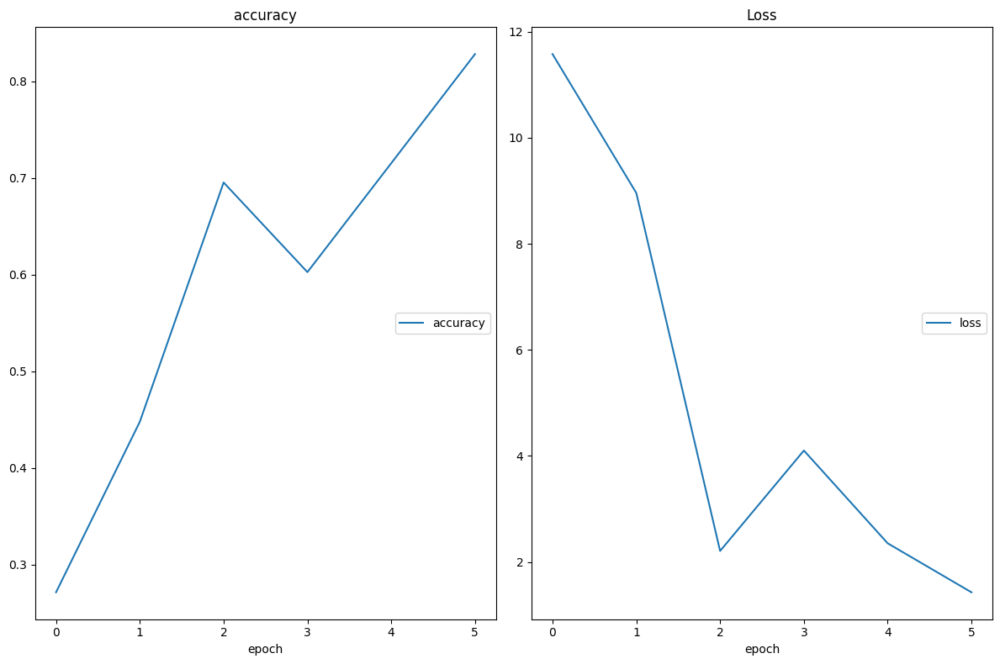

accuracy
	accuracy         	 (min:    0.272, max:    0.828, cur:    0.828)
Loss
	loss             	 (min:    1.428, max:   11.578, cur:    1.428)
3/3 [==============================] - 127s 41s/step - loss: 1.4282 - accuracy: 0.8281
CPU times: user 17min 30s, sys: 52.9 s, total: 18min 23s
Wall time: 12min 7s


In [ ]:
%%time

plot_loss_2 = PlotLossesCallback()

# Retrain model with fine-tuning
vgg_ft_history = vgg_model_ft.fit(traingen,
                                  batch_size=BATCH_SIZE,
                                  epochs=n_epochs,
                                  validation_data=validgen,
                                  steps_per_epoch=n_steps, 
                                  validation_steps=n_val_steps,
                                  callbacks=[tl_checkpoint_1, early_stop, plot_loss_2],
                                  verbose=1)

In [ ]:
# Generate predictions
vgg_model_ft.load_weights('tl_model_v1.weights.best.hdf5') # initialize the best trained weights

vgg_preds_ft = vgg_model_ft.predict(testgen)
vgg_pred_classes_ft = np.argmax(vgg_preds_ft, axis=1)

50/50 [==============================] - 38s 743ms/step


In [ ]:
vgg_acc_ft = accuracy_score(true_classes, vgg_pred_classes_ft)
print("VGG16 Model Accuracy with Fine-Tuning: {:.2f}%".format(vgg_acc_ft * 100))
vgg_model.save("content/model3.h5")

VGG16 Model Accuracy with Fine-Tuning: 82.00%


#4.1 (Sequential Models)
In this approach, we will again first import required libraries, then upload our dataset in a similar way as above but this time we have a single folder containing subfolders of the 5 classes and another folder for testing on unseen data also containing subfolders of 5 classes.
We need to run each cell one by one.

In [ ]:
#loading essential libraries 
import numpy as np
import os
import PIL
import PIL.Image
import tensorflow as tf
from tensorflow.keras import layers

Here we load the dataset and again set the paramters as per requirement. We are splitting the training dataset into train and validation, with validation containing 10% of the images.

In [ ]:
#setting important parameters and loading the three required datasets
batch_size = 64
img_height = 180
img_width = 180
data_dir= "/content/dataset_1/classes"
#using bigger dataset for now
data_dir_new="/content/dataset_2/classes"
train_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir_new,  
  validation_split=0.1,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

val_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir_new,
  validation_split=0.1,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)
class_names = train_ds.class_names
print(class_names)


Found 250 files belonging to 5 classes.
Using 225 files for training.
Found 250 files belonging to 5 classes.
Using 25 files for validation.
['animals', 'beauty', 'food', 'memes', 'travel']


In [ ]:
#creating test_ds and loading images
batch_size = 32
img_height = 180
img_width = 180
test_dir= "/content/dataset_2/test"
test_ds = tf.keras.utils.image_dataset_from_directory(
  test_dir,  
  image_size=(img_height, img_width),
  batch_size=batch_size)


Found 50 files belonging to 5 classes.


Printing the dimension of the object generated by tf.keras.utils.image_dataset_from_directory function which is a tf.data.dataset object - float32 tensor and int32 tensor


In [ ]:
test_ds = test_ds.map(lambda x, y: (tf.keras.applications.resnet50.preprocess_input(x), y))


In [ ]:
for image_batch, labels_batch in train_ds:
  print(image_batch.shape)
  print(labels_batch.shape)
  break

(64, 180, 180, 3)
(64,)


Plotting 9 images from batch specified in .take() - random each time because of seed


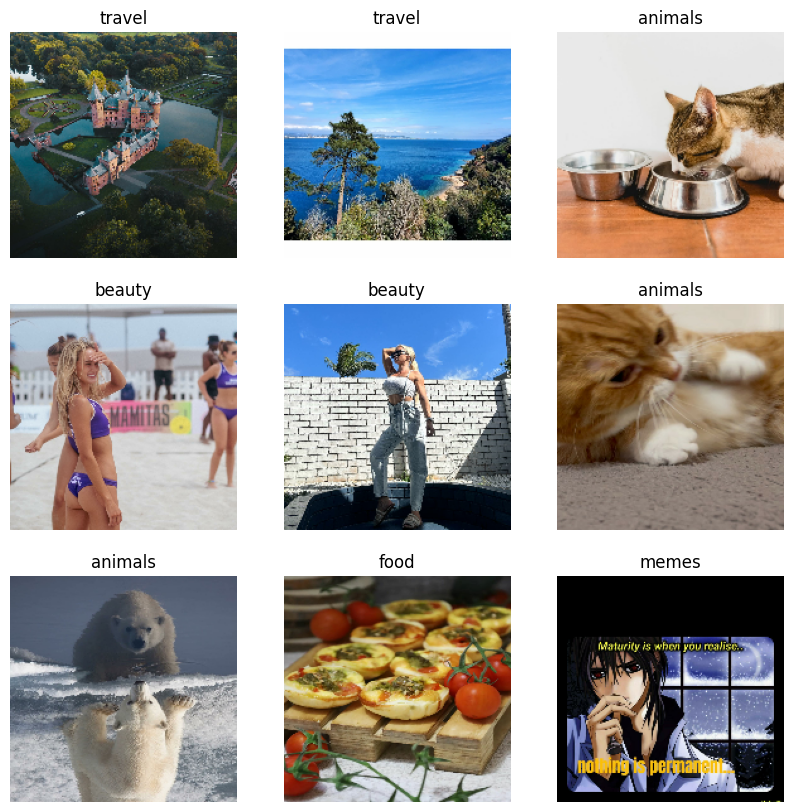

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

In [ ]:
#autotuning data and applying prefetch
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.prefetch(buffer_size=AUTOTUNE)
test_ds = test_ds.prefetch(buffer_size=AUTOTUNE)

In [ ]:
# creating data augmentation layer
data_augmentation = tf.keras.Sequential([
  tf.keras.layers.RandomFlip('horizontal'),
  tf.keras.layers.RandomRotation(0.1),
  tf.keras.layers.RandomContrast(factor=0.3),

])

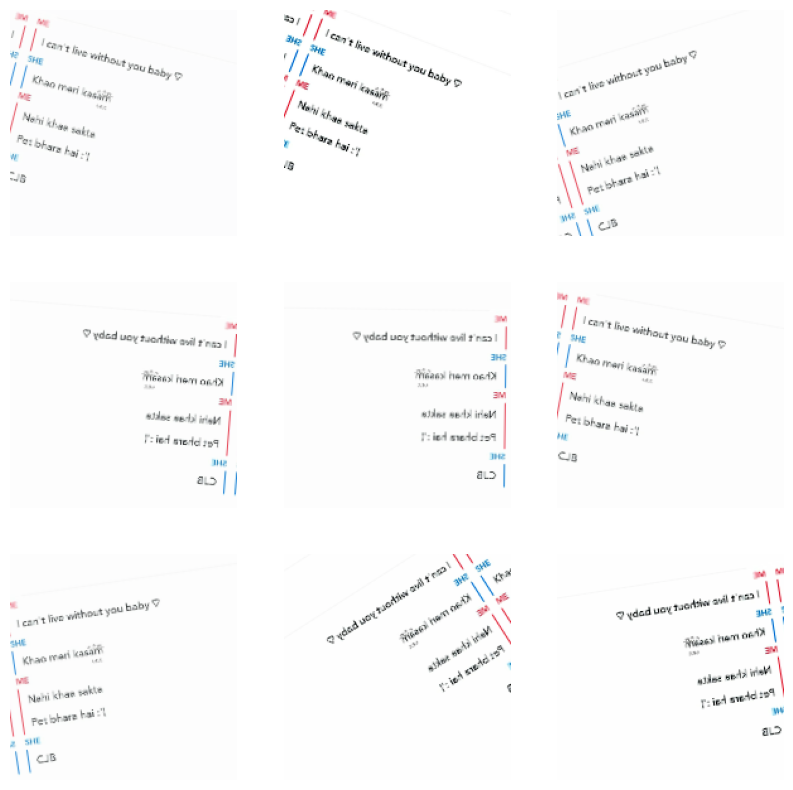

In [ ]:
# plotting one augmented image
for image, _ in train_ds.take(1):
  plt.figure(figsize=(10, 10))
  first_image = image[0]
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    augmented_image = data_augmentation(tf.expand_dims(first_image, 0))
    plt.imshow(augmented_image[0] / 255)
    plt.axis('off')

In [ ]:
# creating normalisation layer to rescale image
normalization_layer = tf.keras.layers.Rescaling(1./255)

In [ ]:
# printing min and max pixel value of image after normalization
normalized_ds = train_ds.map(lambda x, y: (normalization_layer(x), y))
image_batch, labels_batch = next(iter(normalized_ds))
first_image = image_batch[0]
# Notice the pixel values are now in `[0,1]`.
print(np.min(first_image), np.max(first_image))

0.0 1.0


In [ ]:
#initial sequential network built

num_classes = 5

model41 = tf.keras.Sequential([
  normalization_layer,
  data_augmentation,
  tf.keras.layers.Conv2D(32, 3, activation='relu'),
  tf.keras.layers.MaxPooling2D(),
  tf.keras.layers.Conv2D(32, 3, activation='relu'),
  tf.keras.layers.MaxPooling2D(),
  tf.keras.layers.Conv2D(32, 3, activation='relu'),
  tf.keras.layers.MaxPooling2D(),
  tf.keras.layers.Conv2D(32, 3, activation='relu'),
  tf.keras.layers.MaxPooling2D(),
  tf.keras.layers.Flatten(),
  tf.keras.layers.Dense(128, activation='relu'),
  tf.keras.layers.Dense(num_classes)
])

In [ ]:
# compiling sequential model
model41.compile(
  optimizer='adam',
  loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
  metrics=['accuracy'])

In [ ]:
#finding the right value of epochs is tough as we might risk overfitting the model i.e., when accuracy > val_accuracy
model41.fit(
  train_ds,
  validation_data=val_ds,
  epochs=10
)

Epoch 1/10
4/4 [==============================] - 21s 3s/step - loss: 1.6242 - accuracy: 0.1911 - val_loss: 1.6287 - val_accuracy: 0.2400
Epoch 2/10
4/4 [==============================] - 17s 4s/step - loss: 1.5942 - accuracy: 0.3422 - val_loss: 1.6304 - val_accuracy: 0.0800
Epoch 3/10
4/4 [==============================] - 28s 6s/step - loss: 1.5657 - accuracy: 0.2711 - val_loss: 1.5430 - val_accuracy: 0.2400
Epoch 4/10
4/4 [==============================] - 16s 3s/step - loss: 1.4938 - accuracy: 0.3378 - val_loss: 1.4419 - val_accuracy: 0.3200
Epoch 5/10
4/4 [==============================] - 19s 3s/step - loss: 1.4179 - accuracy: 0.3911 - val_loss: 1.3548 - val_accuracy: 0.4000
Epoch 6/10
4/4 [==============================] - 16s 3s/step - loss: 1.3541 - accuracy: 0.4533 - val_loss: 1.3882 - val_accuracy: 0.4400
Epoch 7/10
4/4 [==============================] - 17s 3s/step - loss: 1.3129 - accuracy: 0.4400 - val_loss: 1.2985 - val_accuracy: 0.4000
Epoch 8/10
4/4 [==================

In [ ]:
#saving model so that we don't have to do the above steps again
model41.save('/content/model41.h5')

#4.2

In [ ]:
#second sequential model 
#accuracy stuck after a certain point (haven't checked why yet)
model42 = tf.keras.Sequential([
    normalization_layer,
  data_augmentation,
tf.keras.layers.Conv2D(16,(3,3),activation = tf.nn.relu,input_shape=(180,180, 3)),
tf.keras.layers.MaxPooling2D(2,2),
tf.keras.layers.Conv2D(32,(3,3),activation = tf.nn.relu),
tf.keras.layers.MaxPooling2D(2,2),
tf.keras.layers.Conv2D(64,(3,3),activation = tf.nn.relu),
tf.keras.layers.MaxPooling2D(2,2),
tf.keras.layers.Conv2D(128,(3,3),activation = tf.nn.relu),
tf.keras.layers.MaxPooling2D(2,2),
tf.keras.layers.Flatten(),
tf.keras.layers.Dropout(0.5),
tf.keras.layers.Dense(512,kernel_regularizer = tf.keras.regularizers.l2(0.001), activation = tf.nn.relu),
tf.keras.layers.Dense(5,activation = tf.nn.relu)
])


In [ ]:
model42.compile(
  optimizer='adam',
  loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
  metrics=['accuracy'])

In [ ]:
#finding the right value of epochs is tough, we run epochs until accuracy> val_accuracy then we stop
model42.fit(
  train_ds,
  validation_data=val_ds,
  epochs=8
)

Epoch 1/8
4/4 [==============================] - 25s 3s/step - loss: 2.5641 - accuracy: 0.1733 - val_loss: 2.3694 - val_accuracy: 0.2000
Epoch 2/8
4/4 [==============================] - 14s 3s/step - loss: 2.3022 - accuracy: 0.2356 - val_loss: 2.1827 - val_accuracy: 0.2000
Epoch 3/8
4/4 [==============================] - 15s 2s/step - loss: 2.1131 - accuracy: 0.2578 - val_loss: 2.0550 - val_accuracy: 0.0800
Epoch 4/8
4/4 [==============================] - 15s 2s/step - loss: 1.9865 - accuracy: 0.2578 - val_loss: 1.9170 - val_accuracy: 0.1200
Epoch 5/8
4/4 [==============================] - 15s 2s/step - loss: 1.9020 - accuracy: 0.2933 - val_loss: 1.7277 - val_accuracy: 0.3200
Epoch 6/8
4/4 [==============================] - 15s 2s/step - loss: 1.7689 - accuracy: 0.3156 - val_loss: 1.7194 - val_accuracy: 0.3200
Epoch 7/8
4/4 [==============================] - 15s 2s/step - loss: 1.7061 - accuracy: 0.3511 - val_loss: 1.6867 - val_accuracy: 0.2400
Epoch 8/8
4/4 [==========================

In [ ]:
model42.save('/content/model42.h5')

#4.3

In [ ]:
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, Activation
from keras.regularizers import l1_l2

model = Sequential()
model.add(normalization_layer)
model.add(data_augmentation)
#### Input Layer ####
model.add(Conv2D(filters=32, kernel_size=(3,3), padding='same',
                 activation='relu', input_shape=(128, 128, 3)))

#### Convolutional Layers ####
model.add(Conv2D(32, (3,3), activation='relu'))
model.add(MaxPooling2D((2,2)))  # Pooling
model.add(Dropout(0.2)) # Dropout

model.add(Conv2D(64, (3,3), padding='same', activation='relu'))
model.add(Conv2D(64, (3,3), activation='relu'))
model.add(MaxPooling2D((2,2)))
model.add(Dropout(0.2))

model.add(Conv2D(128, (3,3), padding='same', activation='relu'))
model.add(Conv2D(128, (3,3), activation='relu'))
model.add(Activation('relu'))
model.add(MaxPooling2D((2,2)))
model.add(Dropout(0.2))

model.add(Conv2D(512, (5,5), padding='same', activation='relu'))
model.add(Conv2D(512, (5,5), activation='relu'))
model.add(MaxPooling2D((4,4)))
model.add(Dropout(0.2))

#### Fully-Connected Layer ####
model.add(Flatten())
model.add(Dense(1024, activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(5, activation='softmax'))
model.build((None,180,180,3))
model.summary() # a handy way to inspect the architecture

Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 180, 180, 3)       0         
                                                                 
 sequential (Sequential)     (None, 180, 180, 3)       0         
                                                                 
 conv2d_48 (Conv2D)          (None, 180, 180, 32)      896       
                                                                 
 conv2d_49 (Conv2D)          (None, 178, 178, 32)      9248      
                                                                 
 max_pooling2d_28 (MaxPoolin  (None, 89, 89, 32)       0         
 g2D)                                                            
                                                                 
 dropout_31 (Dropout)        (None, 89, 89, 32)        0         
                                                      

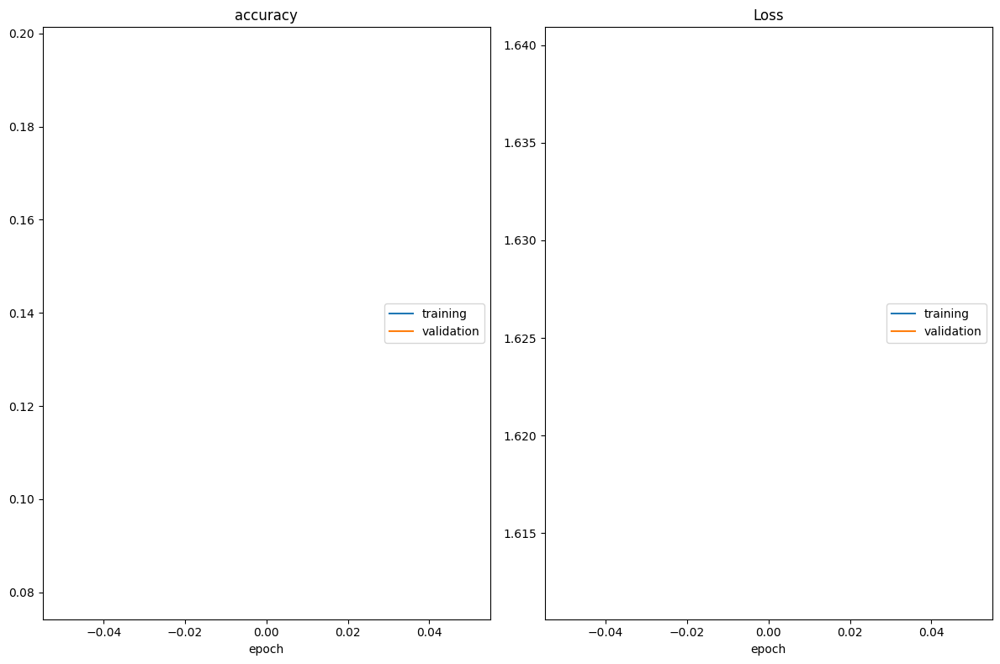

accuracy
	training         	 (min:    0.196, max:    0.196, cur:    0.196)
	validation       	 (min:    0.080, max:    0.080, cur:    0.080)
Loss
	training         	 (min:    1.640, max:    1.640, cur:    1.640)
	validation       	 (min:    1.612, max:    1.612, cur:    1.612)
CPU times: user 3min 28s, sys: 12.8 s, total: 3min 41s
Wall time: 3min 24s


In [ ]:
%%time

from keras.optimizers import RMSprop
from keras.callbacks import ModelCheckpoint, EarlyStopping, TensorBoard
from livelossplot import PlotLossesKeras

steps_per_epoch = 82
val_steps = 10

n_epochs = 5

optimizer = RMSprop(learning_rate=0.0001)

model.compile(loss='sparse_categorical_crossentropy', optimizer=optimizer, metrics=['accuracy'])

# Saves Keras model after each epoch
checkpointer = ModelCheckpoint(filepath='img_model.weights.best.hdf5', 
                               verbose=1, 
                               save_best_only=True)

# Early stopping to prevent overtraining and to ensure decreasing validation loss
early_stop = EarlyStopping(monitor='val_loss',
                           patience=10,
                           restore_best_weights=True,
                           mode='min')

# tensorboard_callback = TensorBoard(log_dir="./logs")

# Actual fitting of the model
history = model.fit(train_ds,
                    epochs=n_epochs, 
                    steps_per_epoch=steps_per_epoch,
                    validation_data=val_ds,
                    validation_steps=val_steps,
                    callbacks=[early_stop, checkpointer, PlotLossesKeras()],
                    verbose=False)

In [ ]:
model.save("/content/model43.h5")

#Testing 4.1, 4.2 and 4.3

Testing Model 4.1

In [ ]:
# evaluating on test_ds and val_ds and train_ds also
test_loss1, test_acc1 = model41.evaluate(test_ds)
val_loss1, val_acc1=model41.evaluate(val_ds)
train_loss1,train_acc1=model41.evaluate(train_ds)

4/4 [==============================] - 11s 1s/step - loss: 1.1819 - accuracy: 0.5200


In [ ]:
print('Test loss :', test_loss1, 'Test accuracy:', test_acc1)
print('Val loss :', val_loss1, 'Val accuracy:', val_acc1)
print('Train loss :', train_loss1, 'Train accuracy:', train_acc1)

Test loss : 2.6682231426239014 Test accuracy: 0.2800000011920929
Val loss : 0.5037016868591309 Val accuracy: 0.8313252925872803
Train loss : 0.42265239357948303 Train accuracy: 0.8592974543571472


Testing Model 4.2

In [ ]:
test_loss2, test_acc2 = model42.evaluate(test_ds)
val_loss2, val_acc2=model42.evaluate(val_ds)
train_loss2,train_acc2=model42.evaluate(train_ds)

4/4 [==============================] - 6s 486ms/step - loss: 1.5913 - accuracy: 0.3200


In [ ]:
print('Test loss :', test_loss2, 'Test accuracy:', test_acc2)
print('Test loss :', val_loss2, 'Test accuracy:', val_acc2)
print('Test loss :', train_loss2, 'Test accuracy:', train_acc2)

Test loss : 2.4911293983459473 Test accuracy: 0.27399998903274536
Test loss : 0.7142755389213562 Test accuracy: 0.8158347606658936
Test loss : 0.6298749446868896 Test accuracy: 0.8360061049461365


Plotting images and labels for unseen data on any model

1/1 [==============================] - 0s 148ms/step
[[-1.0798807  5.0661507  0.7350336 -0.6484931 -1.3529637]]


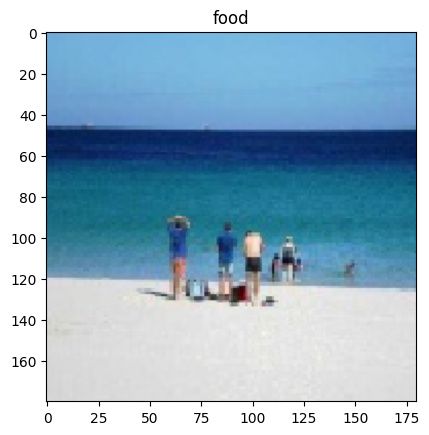

1/1 [==============================] - 0s 41ms/step
[[-1.0275465   0.64344317  2.6668026   2.163408   -2.1995325 ]]


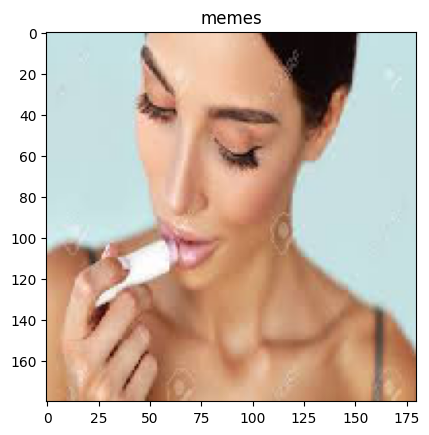

1/1 [==============================] - 0s 45ms/step
[[  5.520195    4.1828985   8.481001    1.0795946 -19.569048 ]]


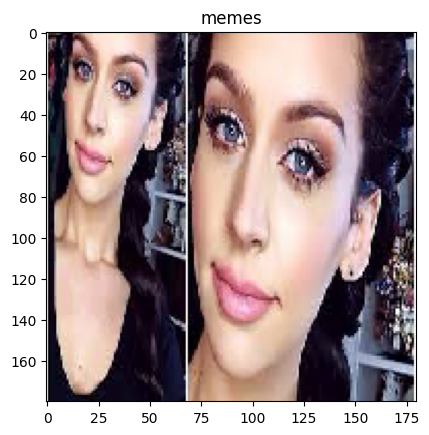

1/1 [==============================] - 0s 43ms/step
[[-0.85179627  4.46899     1.8649898  -0.64548874 -3.1263895 ]]


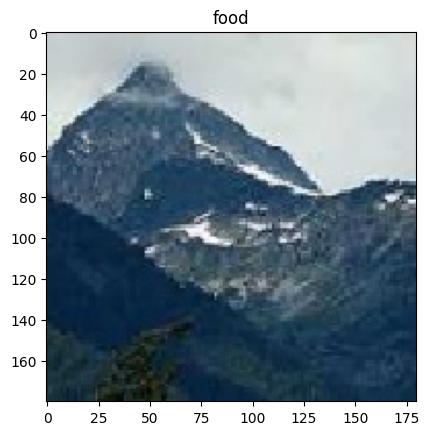

1/1 [==============================] - 0s 43ms/step
[[-0.8858889   0.22926374  2.979182    1.2419592  -0.64599884]]


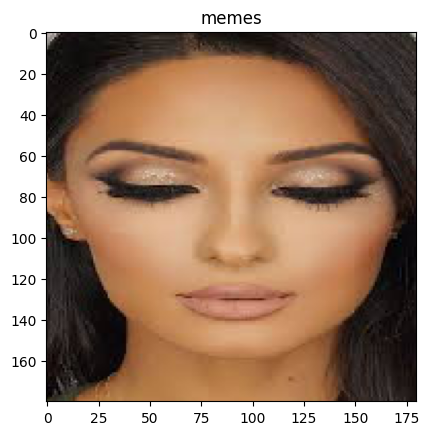

1/1 [==============================] - 0s 39ms/step
[[ 1.0326108   1.3489963   4.9635544   0.44466048 -7.7419534 ]]


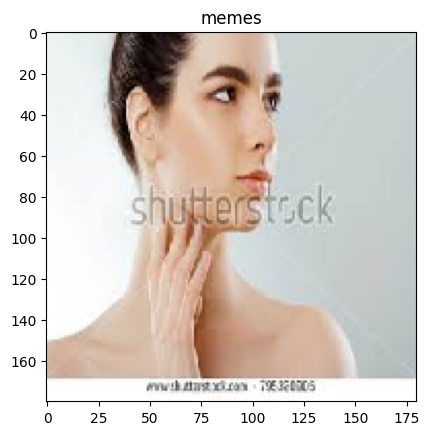

1/1 [==============================] - 0s 50ms/step
[[-1.2225071   0.33572412  2.3112757   3.6523404  -2.5853074 ]]


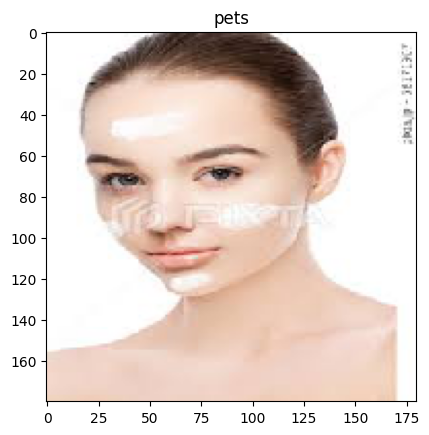

1/1 [==============================] - 0s 51ms/step
[[ 1.4755256   2.2695622   3.8910666   0.03775532 -7.082655  ]]


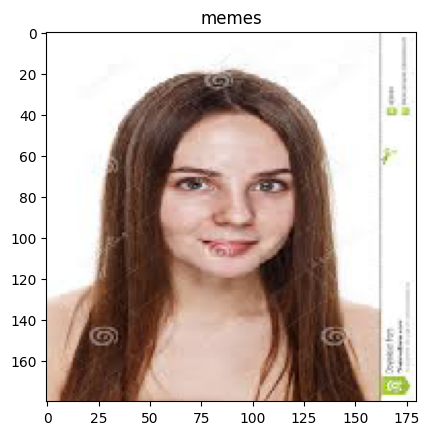

1/1 [==============================] - 0s 38ms/step
[[  5.2009163   4.4616313   6.2722645  -1.440695  -15.401529 ]]


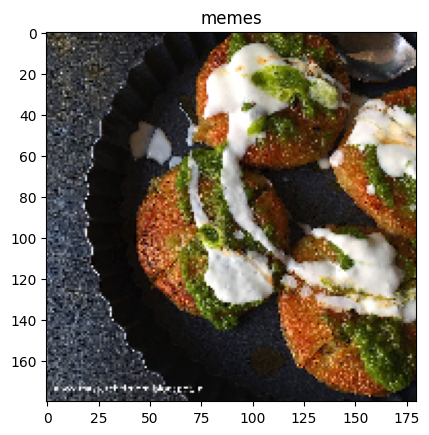

1/1 [==============================] - 0s 51ms/step
[[-0.5168035  2.0641055  2.675072   1.3090081 -4.533207 ]]


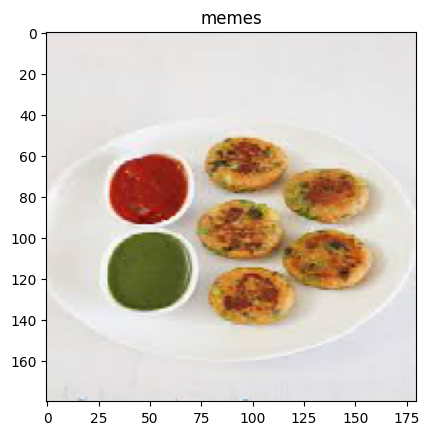

1/1 [==============================] - 0s 40ms/step
[[  2.5534468   5.3342814   3.2700522  -1.1792923 -10.198095 ]]


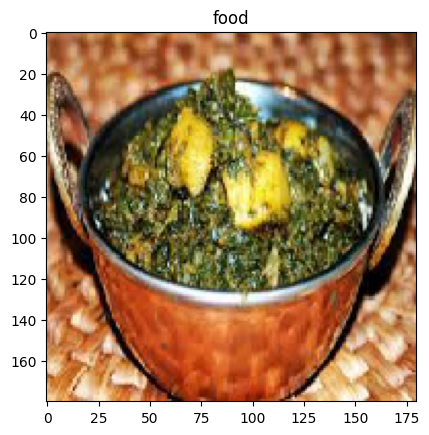

1/1 [==============================] - 0s 40ms/step
[[-0.13757959  0.45214653  2.4898956   1.4596509  -3.4981554 ]]


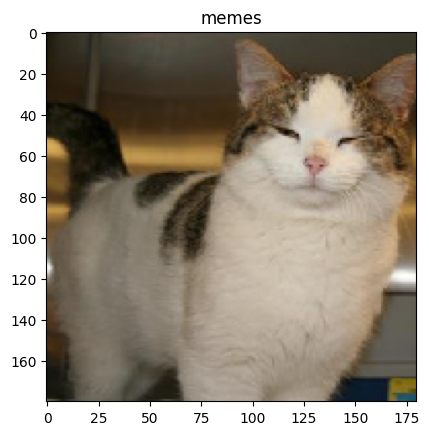

1/1 [==============================] - 0s 34ms/step
[[ 1.1764357  2.2776845  3.1891387 -0.5861155 -5.506785 ]]


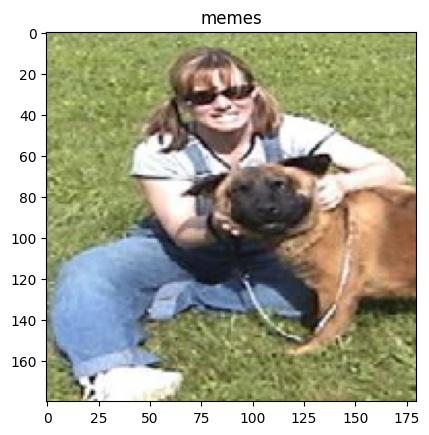

1/1 [==============================] - 0s 51ms/step
[[ 0.41977686  3.6698906   0.15317716  0.94317245 -4.1869693 ]]


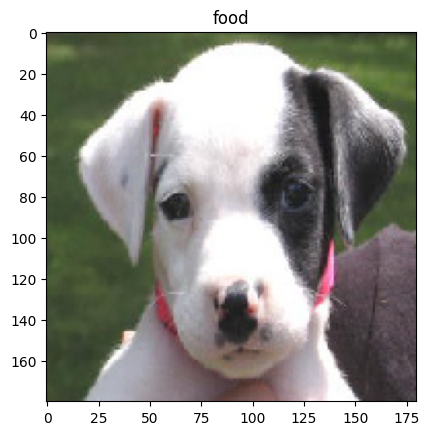

1/1 [==============================] - 0s 42ms/step
[[  9.363291  15.382534  42.52337  -19.037779 -42.145363]]


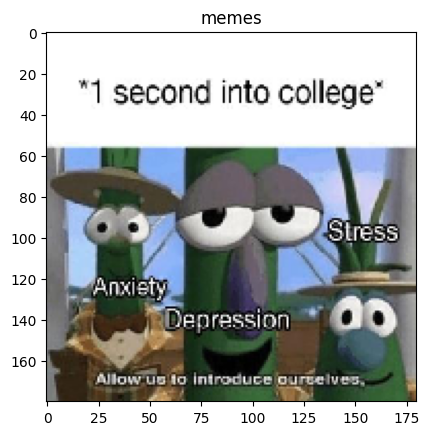

1/1 [==============================] - 0s 81ms/step
[[ 0.57504916  3.9595203   0.791354    0.7686761  -5.9529133 ]]


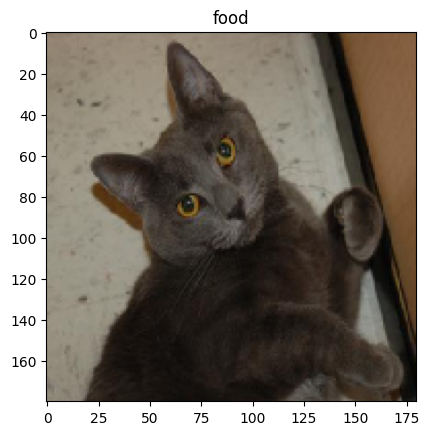

1/1 [==============================] - 0s 137ms/step
[[-2.2208066  0.628418   1.8509995  3.2533944 -1.5458136]]


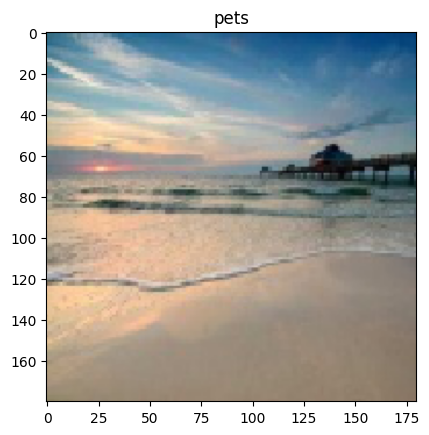

1/1 [==============================] - 0s 80ms/step
[[  8.348752   9.652827  32.58312  -15.090136 -36.365334]]


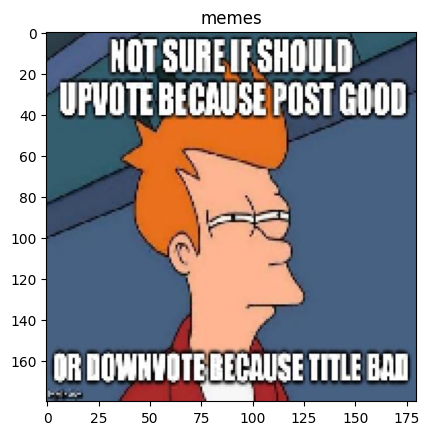

1/1 [==============================] - 0s 101ms/step
[[ 11.330016   5.156444  22.903004  -8.971035 -23.422937]]


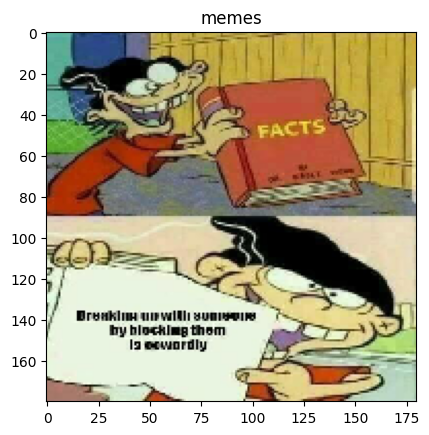

1/1 [==============================] - 0s 81ms/step
[[ 2.413957   1.9713358  7.2296176 -1.0977734 -9.707098 ]]


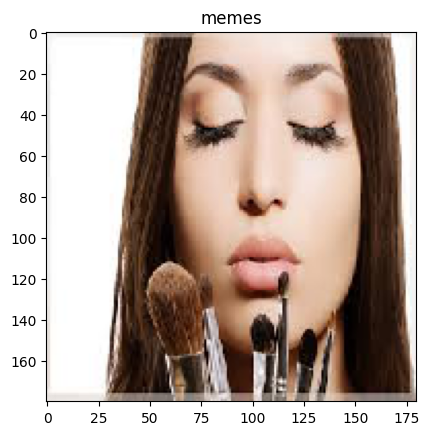

1/1 [==============================] - 0s 71ms/step
[[-0.06847184  3.320651    0.8002111   1.135738   -4.1988096 ]]


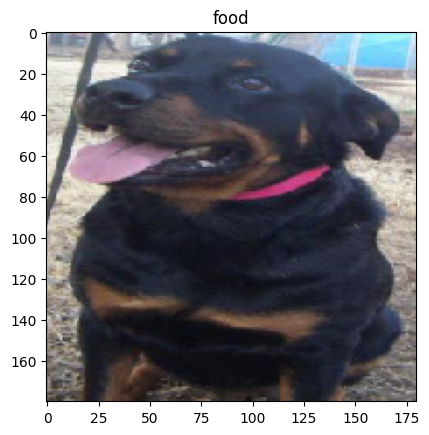

1/1 [==============================] - 0s 64ms/step
[[ 0.36901438  1.4142036   1.0072671   3.7017653  -5.6036663 ]]


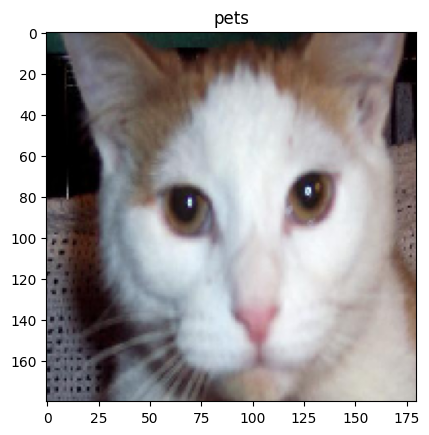

1/1 [==============================] - 0s 83ms/step
[[  0.3018404  15.785117   29.107622  -13.251254  -29.91778  ]]


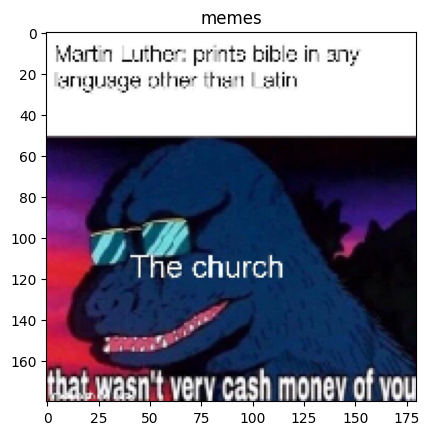

1/1 [==============================] - 0s 56ms/step
[[ 0.68342084  3.2291      1.2734127  -0.32490897 -4.2210035 ]]


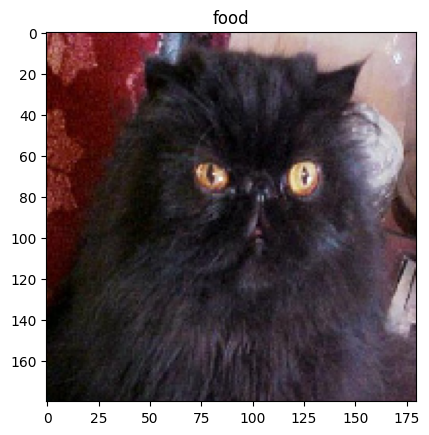

1/1 [==============================] - 0s 55ms/step
[[  7.5293765  11.172784   28.811615  -15.5151825 -31.092451 ]]


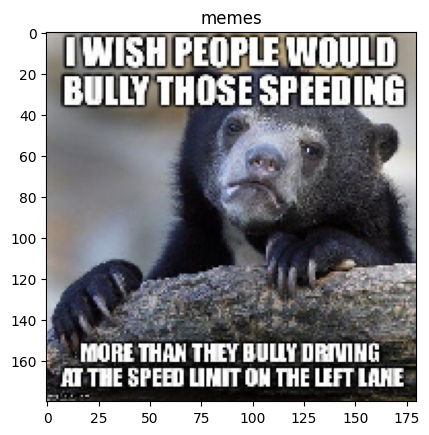

1/1 [==============================] - 0s 55ms/step
[[ 0.11469967  2.4452047   3.6777787  -0.25798798 -4.7878323 ]]


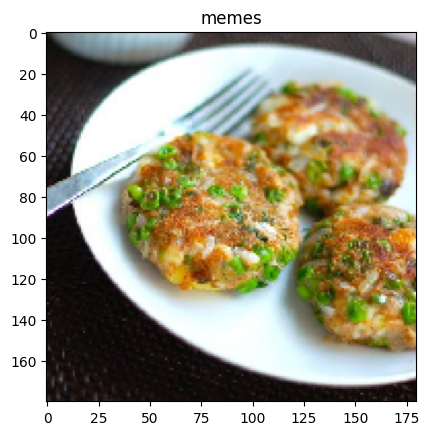

1/1 [==============================] - 0s 55ms/step
[[  8.0382805   9.527066   30.575499  -14.399902  -35.940292 ]]


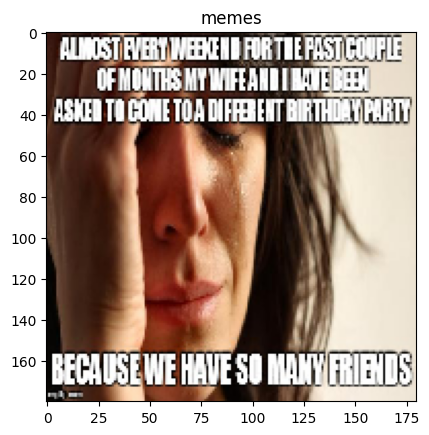

1/1 [==============================] - 0s 57ms/step
[[ 1.7575271  3.398413   3.9445896 -1.7823955 -6.993478 ]]


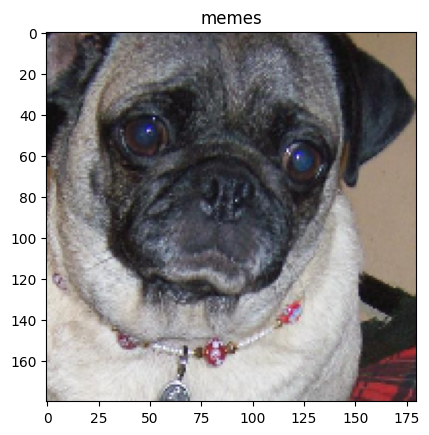

1/1 [==============================] - 0s 57ms/step
[[ 11.17152     7.1852703  23.963968   -9.005389  -34.071266 ]]


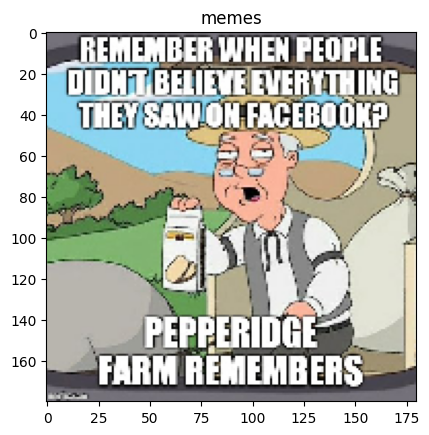

1/1 [==============================] - 0s 57ms/step
[[ -0.32679525  15.382408    32.063984   -12.654937   -33.424778  ]]


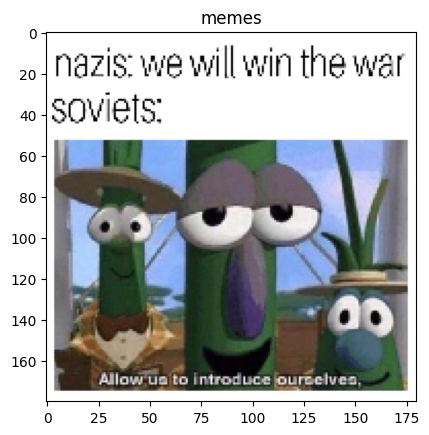

1/1 [==============================] - 0s 57ms/step
[[ 0.40464512  4.3229985   1.1767374  -1.0569366  -3.027068  ]]


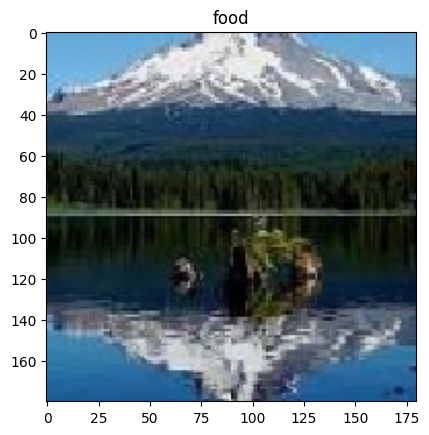

1/1 [==============================] - 0s 62ms/step
[[  3.6648772   4.407962   14.948591   -4.6375537 -16.868412 ]]


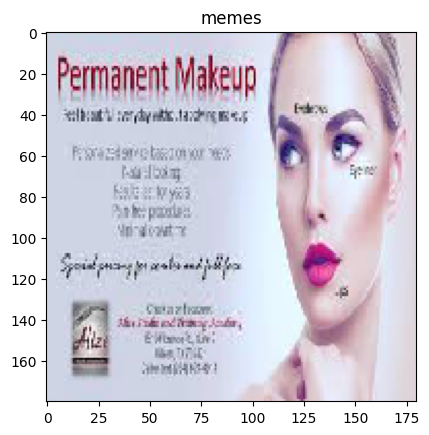

1/1 [==============================] - 0s 52ms/step
[[  4.7812033   3.8520586  36.00902    -9.289334  -34.473152 ]]


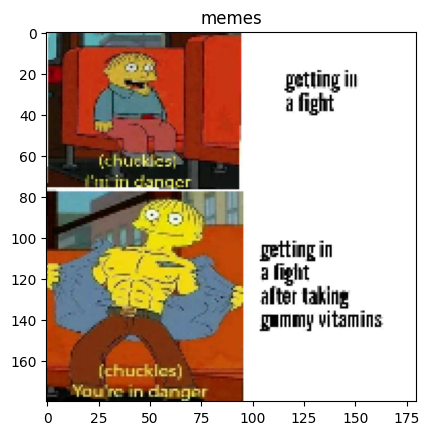

1/1 [==============================] - 0s 70ms/step
[[  5.5273094   7.2763      6.8421187  -4.5999403 -16.844418 ]]


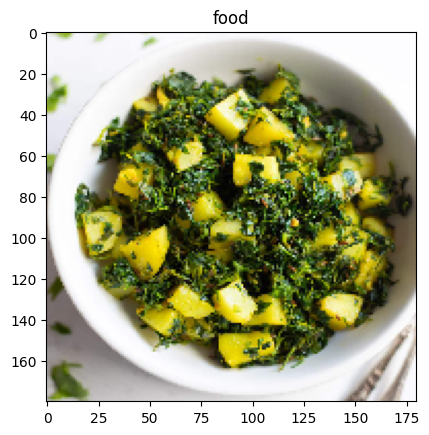

1/1 [==============================] - 0s 55ms/step
[[  5.0721364   5.304201    7.4525094  -2.811942  -16.740713 ]]


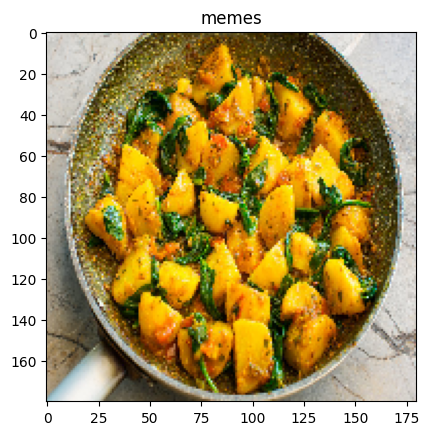

1/1 [==============================] - 0s 57ms/step
[[  1.6675798   3.1426036  13.826508   -4.6974306 -12.714037 ]]


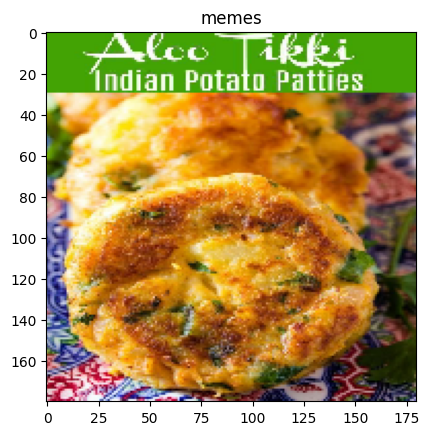

1/1 [==============================] - 0s 70ms/step
[[  4.5854883   8.179795    9.5974655  -3.7099893 -20.16537  ]]


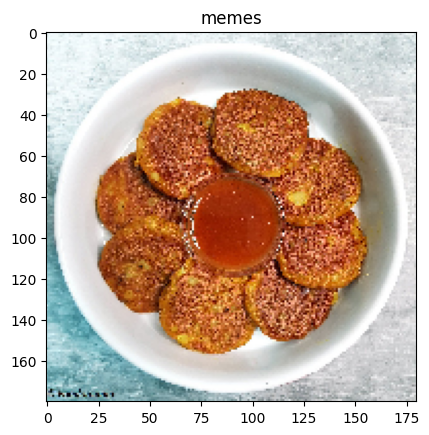

1/1 [==============================] - 0s 43ms/step
[[ -0.7099713  14.222871   29.899923  -11.920094  -31.15544  ]]


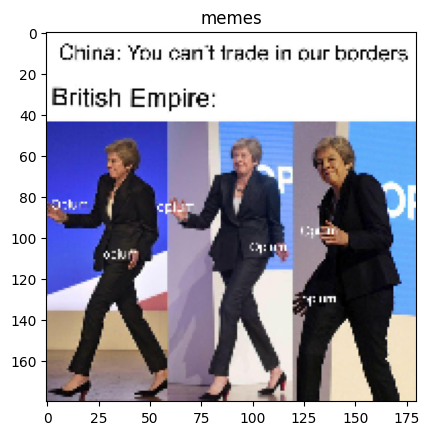

1/1 [==============================] - 0s 60ms/step
[[  2.2039003   6.793893   13.961765   -3.232856  -19.6714   ]]


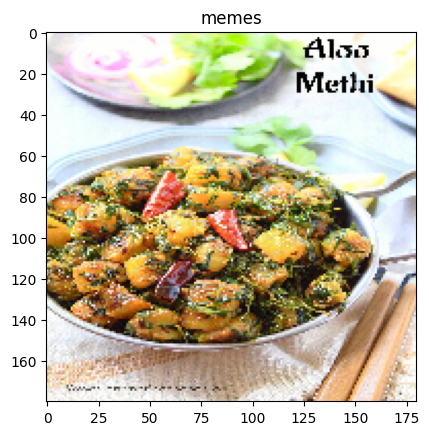

1/1 [==============================] - 0s 57ms/step
[[  5.713696    5.211856    8.702749   -3.7044995 -16.800877 ]]


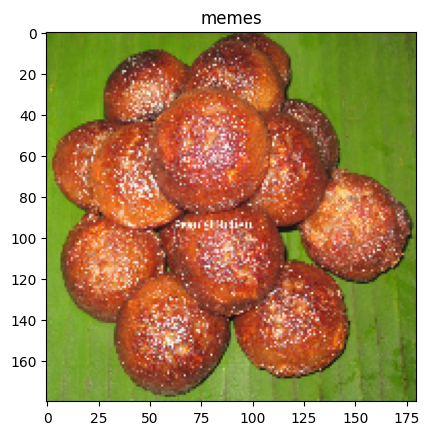

1/1 [==============================] - 0s 61ms/step
[[ 0.8751911  2.3414447  3.4710653 -0.2775278 -6.1977053]]


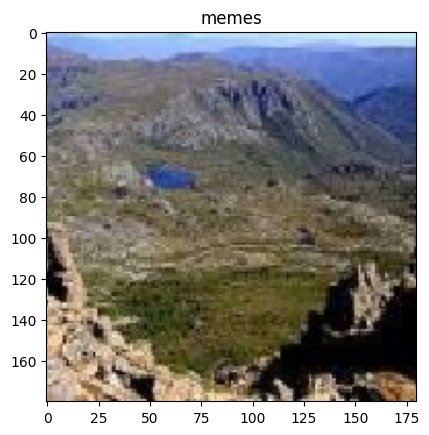

1/1 [==============================] - 0s 60ms/step
[[-1.1969745  1.0450883  3.7501755  1.5007772 -2.96076  ]]


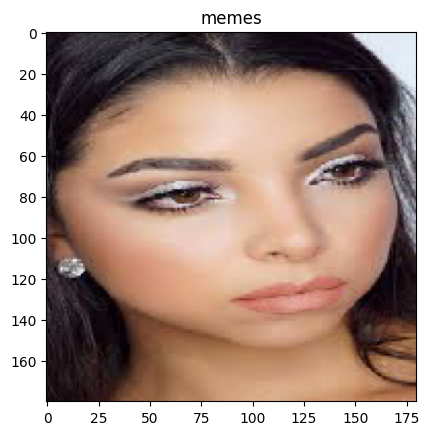

1/1 [==============================] - 0s 69ms/step
[[ 0.315501   -0.23122497 -0.15240026  0.82688034  2.6455522 ]]


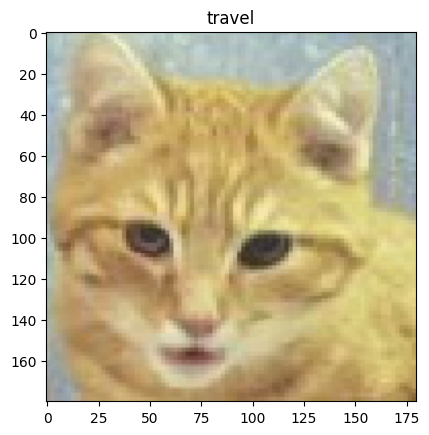

1/1 [==============================] - 0s 85ms/step
[[ 0.3593114   2.5731697   2.602645   -0.61867434 -4.3697166 ]]


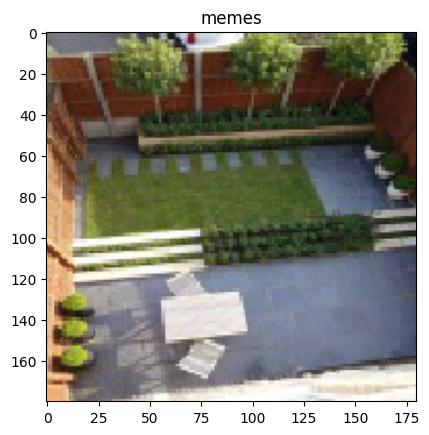

1/1 [==============================] - 0s 76ms/step
[[-1.2169617 -1.6251904  1.8654205  3.8456295 -1.1543919]]


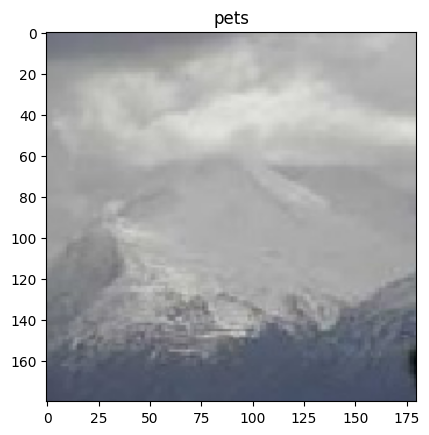

1/1 [==============================] - 0s 49ms/step
[[-0.6075197   2.1233993   2.4127862  -0.73769957 -2.6799502 ]]


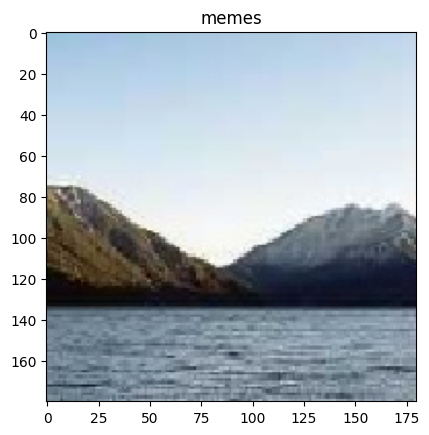

1/1 [==============================] - 0s 34ms/step
[[ 3.0328517   2.2211864   4.6492214  -0.47254997 -9.831375  ]]


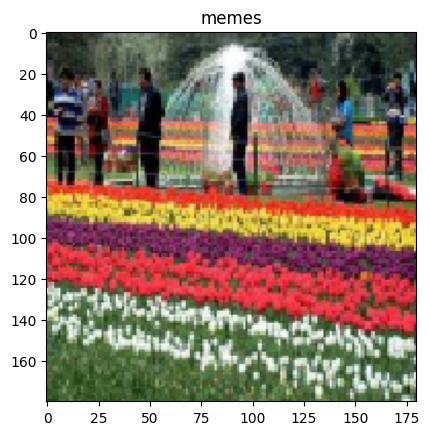

1/1 [==============================] - 0s 37ms/step
[[-0.0398585  1.6572924  4.438079   0.129435  -4.820266 ]]


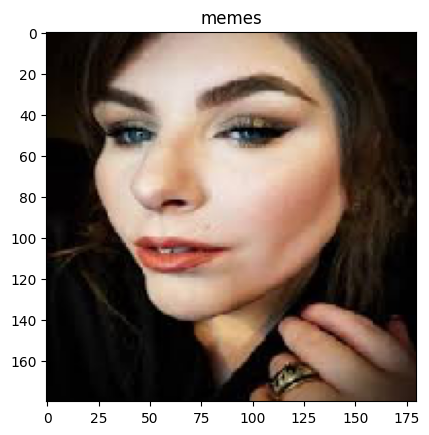

1/1 [==============================] - 0s 37ms/step
[[ 1.2358242   1.8331765   1.9025935   0.14820535 -5.251892  ]]


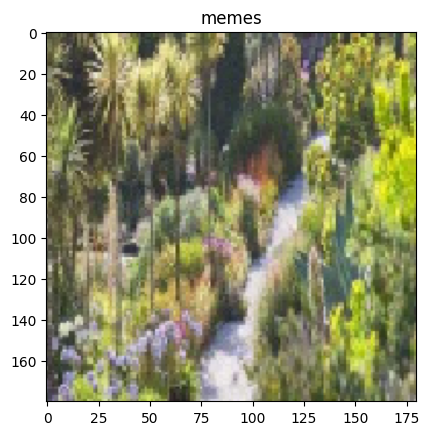

1/1 [==============================] - 0s 47ms/step
[[-0.5675938   0.15981843  0.70062435  2.1204662  -0.4531433 ]]


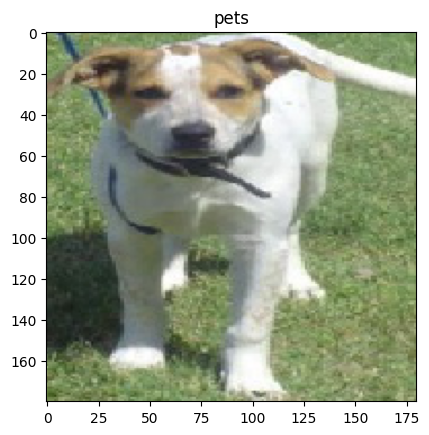

In [ ]:
# using the first model to display images on unseen data with predicted labels - very inaccuarate, as expected.
from keras.applications.imagenet_utils import preprocess_input
from tensorflow.keras.utils import load_img
from tensorflow.keras.preprocessing import image
from keras.models import load_model
import numpy as np
import os
import matplotlib.pyplot as plt

model = load_model('/content/model41.h5')

# Set the path to the folder containing the images
folder_path = '/content/dataset_2/unseen'

# Loop through the images in the folder
for filename in os.listdir(folder_path):
    
    # Load the image
    img = image.load_img(os.path.join(folder_path, filename), target_size=(180, 180))
    
    # Convert the image to a numpy array
    img_array = image.img_to_array(img)
    
    # Reshape the array to match the input shape of the VGG16 model
    img_array = np.expand_dims(img_array, axis=0)
    
    # Preprocess the input image (normalize pixel values to be between -1 and 1)
    img_array = preprocess_input(img_array)
    
    # Make a prediction on the image
    preds = model.predict(img_array)
    print(preds)
    
    # Decode the prediction into a human-readable label
    label = int(preds.argmax(axis=-1))
    label_name={0:'beauty',1:'food',2:'memes',3:'pets',4:'travel'}
    #label_name={0:'animals',1:'beauty',2:'food',3:'memes',4:'travel'}

    
    # Display the image with predicted label
    plt.imshow(img)
    plt.title(label_name[label])
    plt.show()



Testing Model 4.3 - an error

In [ ]:
#third model
model.load_weights('/content/model43.h5')

predicted_classes = model.predict_classes(test_ds)

class_indices = train_ds.class_indices
class_indices = dict((v,k) for k,v in class_indices.items())
true_classes = test_ds.classes

ModuleNotFoundError: ignored

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_fscore_support, accuracy_score

def display_results(y_true, y_preds, class_labels):
    
    results = pd.DataFrame(precision_recall_fscore_support(y_true, y_preds),
                          columns=class_labels).T

    results.rename(columns={0: 'Precision', 1: 'Recall',
                            2: 'F-Score', 3: 'Support'}, inplace=True)
    
    results.sort_values(by='F-Score', ascending=False, inplace=True)                           
    global_acc = accuracy_score(y_true, y_preds)
    
    print("Overall Categorical Accuracy: {:.2f}%".format(global_acc*100))
    return results

def plot_predictions(y_true, y_preds, test_generator, class_indices):

    fig = plt.figure(figsize=(20, 10))
    for i, idx in enumerate(np.random.choice(test_generator.samples, size=20, replace=False)):
        ax = fig.add_subplot(4, 5, i + 1, xticks=[], yticks=[])
        ax.imshow(np.squeeze(test_generator[idx]))
        pred_idx = y_preds[idx]
        true_idx = y_true[idx]
                
        plt.tight_layout()
        ax.set_title("{}\n({})".format(class_indices[pred_idx], class_indices[true_idx]),
                     color=("green" if pred_idx == true_idx else "red"))

In [ ]:
model.load_weights('img_model.weights.best.hdf5')

predicted_classes = model.predict_classes(testgen)

class_indices = traingen.class_indices
class_indices = dict((v,k) for k,v in class_indices.items())
true_classes = testgen.classes

AttributeError: ignored

In [ ]:
plot_predictions(true_classes, predicted_classes, testgen, class_indices)


NameError: ignored

In [ ]:
display_results(true_classes, predicted_classes, class_indices.values())


NameError: ignored